In [6]:
# import all packages
import CA
from CA import Automata, Cell, Conway
import time
from matplotlib import pyplot as plt
from matplotlib import animation
import numpy as np
import random
import TDA
import pandas as pd
from tda.tda import CubicalRipser2D, Ripser, Filter2D
import pylab as pl
from matplotlib import collections  as mc
from matplotlib.collections import LineCollection

import struct
import csv
from matplotlib import gridspec
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
import scipy.interpolate as interp
import ipywidgets as widgets
from IPython.display import display
import scipy.interpolate
import warnings
warnings.filterwarnings('ignore')

import numpy as np
#from ripser import ripser, plot_dgms

%matplotlib notebook
import matplotlib.pyplot as plt
from matplotlib import gridspec
from mpl_toolkits.mplot3d import Axes3D

from sklearn.decomposition import PCA

import scipy.interpolate as interp

import ipywidgets as widgets
from IPython.display import display

import warnings
warnings.filterwarnings('ignore')

# Discovering Periodic Signals in Images With Topological Data Analysis

## Nicholas Carrara and Justin Curry
### University at Albany

Notes for Nick:

- We want to start with a visual demonstration of what traditional TDA methods has done and what we hope to do.
- Please steal the jumping jacks video from Chris Tralie's <a href="https://github.com/ctralie/TDALabs">TDA labs</a> on one slide
- Please insert video of GoL simulation with spatially separated periodic features, e.g. gliders, etc.
- Then we'll have an table of contents slide.

In [14]:
# consider the following video of a person doing jumping jacks, which clearly has some
# global periodic behavior.
CA.display_CA('jumpingjacks.ogg')

## Sliding Windows Embedding

C. Tralie's sliding windows embedding technique is a tool for finding periodic signals in time series data by applying persistence to embeddings of the signal. 

In [15]:
CA.display_CA('jumpingjackssliding.ogg')

## Periodic structures in Cellular Automata

Cellular Automata is a well studied phenomenon that we can use as a benchmark for testing our tools.

In [16]:
CA.display_CA('movie2.mp4')

# Introduction to Persistent Homology

Persistent Homology is a technique for describing the Homology of a sample space by making various assumptions about the structure of the underlying manifold.  One does this by choosing a filtration over the sample space and constructing its associated $n$-complexes.  The homology of the complexes is evaluated at each level of the filtration.  The homological features which happen to persist are then considered to be relevant. 

![title](Plots/persistence1.png)

The topological features that are created and destroyed by the filtration are represented by a *barcode diagram*,

![title](Plots/persistence2.png)

<IPython.core.display.Javascript object>


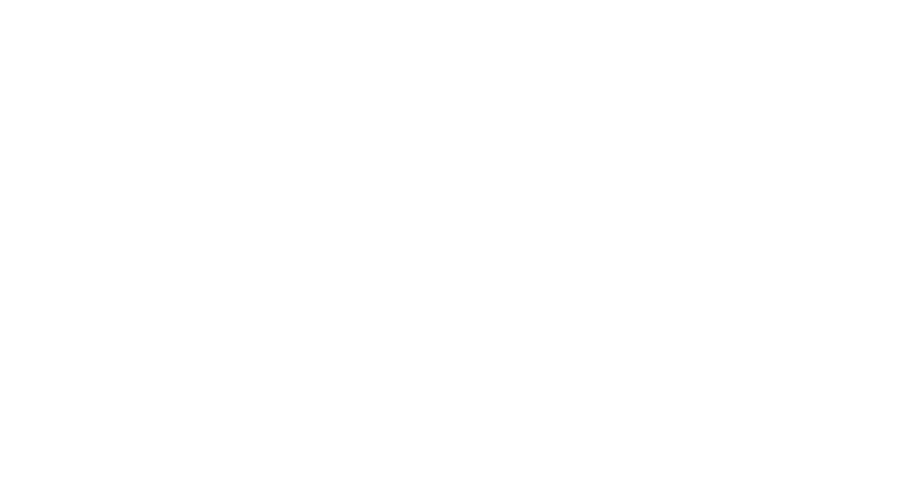

In [7]:
# Here is an example of persistence on a noisy circle.

# create filtration sliders
def on_value_change_filt(change):
    generate_PD()

def on_value_change_points(change):
    generate_new_points()
    
def on_value_change_noise(change):
    generate_noise()

epsilonSlider = widgets.FloatSlider(min=0,max=1.0,step=0.05,value=0.0,description='Epsilon: ',continuous_update=True)
epsilonSlider.observe(on_value_change_filt, names='value')

noiseSlider = widgets.FloatSlider(min=0,max=.5,value=0.0,description='Noise: ',continuous_update=True)
noiseSlider.observe(on_value_change_noise,names='value')

pointsSlider = widgets.IntSlider(min=0,max=100,value=25,description='Num Points: ',continuous_update=True)
pointsSlider.observe(on_value_change_points,names='value')

display(widgets.HBox((epsilonSlider, noiseSlider, pointsSlider)))

plt.figure(figsize=(9,5))

def dist(x,y):
    return np.sqrt((x[0]-y[0])*(x[0]-y[0]) + (x[1]-y[1])*(x[1]-y[1]))

x_orig = np.linspace(-1,1,pointsSlider.value)
y_orig = [0 for i in range(pointsSlider.value)]
# generate the connections for the epislon level
for i in range(pointsSlider.value):
    choice = np.random.uniform(-1,1,1)[0]
    if choice <= 0:
        y_orig[i] = (-1)*np.sqrt(1 - x_orig[i]*x_orig[i]) + np.random.uniform(-noiseSlider.value,noiseSlider.value,1)[0]
    else:
        y_orig[i] = np.sqrt(1 - x_orig[i]*x_orig[i]) + np.random.uniform(-noiseSlider.value,noiseSlider.value,1)[0]

x = np.copy(x_orig)
y = np.copy(y_orig)
rips2 = Ripser()
points = [[x[i],y[i]] for i in range(len(x))]
with open("grid_test.csv","w") as file:
    writer = csv.writer(file,delimiter=",")
    writer.writerows(points)

# Run ripser on this
rips2.ComputeBarcode("grid_test.csv",2,10,1,"point-cloud",1)

# Plot the barcode
barcode = rips2.getBarcode()
def generate_new_points():
    global x_orig,y_orig,x,y,barcode
    x_orig = np.linspace(-1,1,pointsSlider.value)
    y_orig = [0 for i in range(pointsSlider.value)]
    # generate the connections for the epislon level
    for i in range(pointsSlider.value):
        choice = np.random.uniform(-1,1,1)[0]
        if choice <= 0:
            y_orig[i] = (-1)*np.sqrt(1 - x_orig[i]*x_orig[i]) + np.random.uniform(-noiseSlider.value,noiseSlider.value,1)[0]
        else:
            y_orig[i] = np.sqrt(1 - x_orig[i]*x_orig[i]) + np.random.uniform(-noiseSlider.value,noiseSlider.value,1)[0]

    x = np.copy(x_orig)
    y = np.copy(y_orig)
    rips2 = Ripser()
    points = [[x[i],y[i]] for i in range(len(x))]
    with open("grid_test.csv","w") as file:
        writer = csv.writer(file,delimiter=",")
        writer.writerows(points)

    # Run ripser on this
    rips2.ComputeBarcode("grid_test.csv",2,10,1,"point-cloud",1)

    # Plot the barcode
    barcode = rips2.getBarcode()
    generate_PD()
    
def generate_noise():
    global x_orig,y_orig,x,y,barcode
    for i in range(pointsSlider.value):
        choice = np.random.uniform(-1,1,1)[0]
        if choice <= 0:
            y_orig[i] = (-1)*np.sqrt(1 - x_orig[i]*x_orig[i]) + np.random.uniform(-noiseSlider.value,noiseSlider.value,1)[0]
        else:
            y_orig[i] = np.sqrt(1 - x_orig[i]*x_orig[i]) + np.random.uniform(-noiseSlider.value,noiseSlider.value,1)[0]
    y = np.copy(y_orig)
    rips2 = Ripser()
    points = [[x[i],y[i]] for i in range(len(x))]
    with open("grid_test.csv","w") as file:
        writer = csv.writer(file,delimiter=",")
        writer.writerows(points)

    # Run ripser on this
    rips2.ComputeBarcode("grid_test.csv",2,10,1,"point-cloud",1)

    # Plot the barcode
    barcode = rips2.getBarcode()
    generate_PD()
            
def generate_PD():
    global x_orig,y_orig,x,y
    plt.clf()
    ax = plt.subplot(121)
    ax2 = plt.subplot(122)
    # determine the rips diagram
    edges = []
    c = []
    for i in range(pointsSlider.value):
        for j in range(pointsSlider.value):
            if i != j:
                if (dist([x[i],y[i]],[x[j],y[j]]) < 2*epsilonSlider.value):
                    edges.append([(x[i],y[i]),(x[j],y[j])])
                    c.append((1,0,0,1))
    for i in range(pointsSlider.value):
        circle = plt.Circle((x[i],y[i]),epsilonSlider.value,color='b',alpha=0.25)
        ax.add_artist(circle)
    ax.scatter(x,y,color='k')
    c = np.array(c)
    lc = LineCollection(edges, colors=c, linewidths=2)
    y2 = np.linspace(0, 1, 2)
    ax2.plot(y2, y2, color='g', linestyle='--')
    h0x = [0 for i in range(len(barcode)) if barcode[i][0] == 0]
    h0y = [barcode[i][2]/2.0 for i in range(len(barcode)) if barcode[i][0] == 0]
    h1x = [barcode[i][1]/2.0 for i in range(len(barcode)) if barcode[i][0] == 1.0 and barcode[i][1]/2.0 <= epsilonSlider.value]
    h1y = [barcode[i][2]/2.0 for i in range(len(barcode)) if barcode[i][0] == 1.0 and barcode[i][1]/2.0 <= epsilonSlider.value]
    for i in range(len(h1x)):
        if h1y[i] > epsilonSlider.value:
            h1y[i] = epsilonSlider.value
    for i in range(len(h0x)):
        if h0y[i] > epsilonSlider.value:
            h0y[i] = epsilonSlider.value
    ax2.scatter(h0x,h0y,color='b',label=r'$H_0$')
    ax2.scatter(h1x,h1y,color='m',label=r'$H_1$')
    ax2.axhline(epsilonSlider.value)
    ax2.legend()
    ax.add_collection(lc)
    plt.tight_layout()

<IPython.core.display.Javascript object>


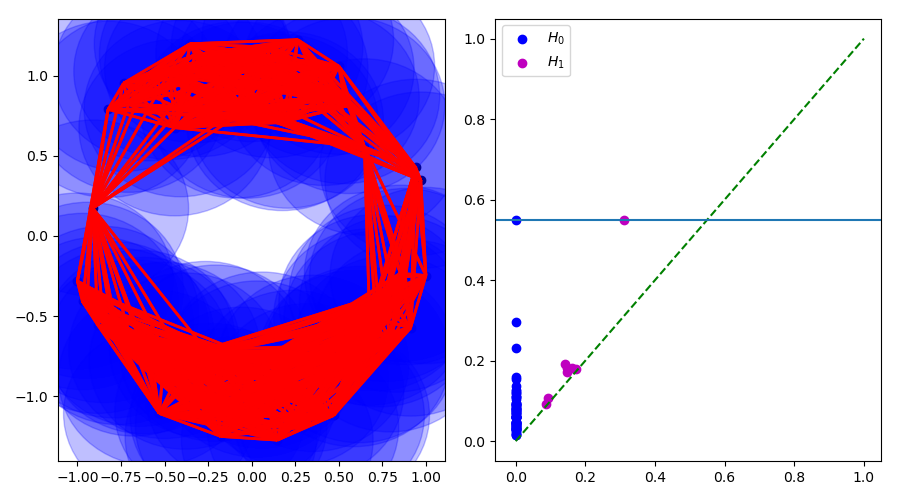

In [8]:
# demonstration of persistence on a noisy circle
display(widgets.HBox((epsilonSlider, noiseSlider, pointsSlider)))
plt.figure(figsize=(9,5))
generate_PD()

# Cellular Automata

A *cellular automata* is an array of cells with an associated state $a \in \mathcal{CA}$ and a rule, $f:\mathcal{CA}\rightarrow\mathcal{CA}$, for updating the state,

![title](Plots/rule.png)

*Example of one-dimensional rule for a binary state automaton.  Each time an update is performed, $f(a)$, the rule here is only a function of the nearest neighbors of each cell.*

The space of possible rules for a given $\mathcal{CA}$ can be arbitrarily large depending on the number of possible states and the parameters of $f$.   

![title](Plots/rules_examples.png)

Here are some examples of one-dimensional Automata which are generated by the initial condition of one live cell in the middle,

<tr>
    <td> <img src="Plots/Rule_3.png" alt="Drawing" style="width: 250px;"/> </td>
    <td> <img src="Plots/Rule_18.png" alt="Drawing" style="width: 250px;"/> </td>
    <td> <img src="Plots/Rule_28.png" alt="Drawing" style="width: 250px;"/> </td>
    <td> <img src="Plots/Rule_30.png" alt="Drawing" style="width: 250px;"/> </td>
</tr>
<tr>
    <td> <img src="Plots/Rule_86.png" alt="Drawing" style="width: 250px;"/> </td>
    <td> <img src="Plots/Rule_99.png" alt="Drawing" style="width: 250px;"/> </td>
    <td> <img src="Plots/Rule_110.png" alt="Drawing" style="width: 250px;"/> </td>
    <td> <img src="Plots/Rule_129.png" alt="Drawing" style="width: 250px;"/> </td>
</tr>
<tr>
    <td> <img src="Plots/Rule_149.png" alt="Drawing" style="width: 250px;"/> </td>
    <td> <img src="Plots/Rule_193.png" alt="Drawing" style="width: 250px;"/> </td>
    <td> <img src="Plots/Rule_218.png" alt="Drawing" style="width: 250px;"/> </td>
    <td> <img src="Plots/Rule_225.png" alt="Drawing" style="width: 250px;"/> </td>
</tr>

In [8]:
# The following code generates one-dimensional CA with the following settings,

def on_value_change(change):
    generate_CA()
    
ruleSlider = widgets.IntSlider(min=0,max=255,value=18,description='Rule:',continuous_update=False)
ruleSlider.observe(on_value_change, names='value')

randomSlider = widgets.FloatSlider(min=0.0,max=1,step=0.01,value=0,description='Percent Random: ',continuous_update=False)
randomSlider.observe(on_value_change, names='value')

widthSlider = widgets.IntSlider(min=1,max=500,step=1,value=50,description='Width: ',continuous_update=False)
widthSlider.observe(on_value_change, names='value')

heightSlider = widgets.IntSlider(min=1,max=500,step=1,value=50,description='Height: ',continuous_update=False)
heightSlider.observe(on_value_change, names='value')




def generate_CA():    
    plt.clf()
    initState = [[0 for i in range(widthSlider.value)]]
    
    
    # Get slider values
    rule = ruleSlider.value
    if randomSlider.value == 0:
        initState[0][int(widthSlider.value/2)] = 1
    else:
        randomState = [i for i in range(widthSlider.value)]
        random.shuffle(randomState)
        for j in range(int(widthSlider.value*randomSlider.value)):
            initState[0][randomState[j]] = 1
    width = widthSlider.value
    height = heightSlider.value
    
    ca = CA.Automata(1, width, 2, 0, rule, 0, .5, height)
    ca.initializeOneDimensionalEmptyCells()
    ca.setCells(initState)
    sequence = ca.generateOneDimensionalSequence()    
    
    #Step 4: Plot 
    plt.imshow(sequence)
    plt.tight_layout()

<IPython.core.display.Javascript object>


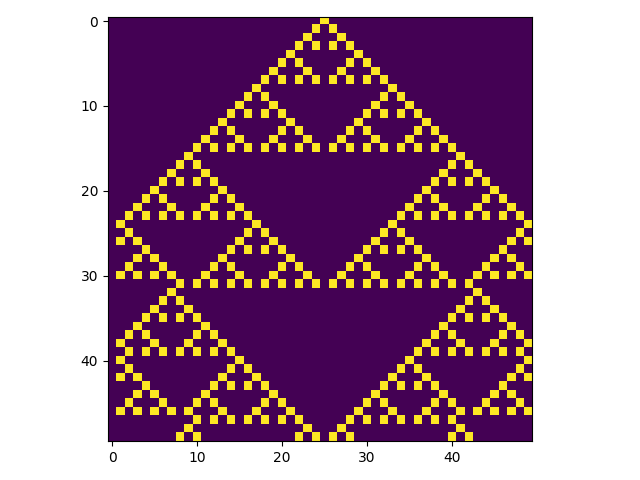

In [9]:
# setup display
display(widgets.HBox((ruleSlider, randomSlider, widthSlider, heightSlider)))
plt.figure()
generate_CA()

# Wolfram's Universality Classes

The four basic classes that Wolfram assigned to each rule were; **Stable, Periodic, Chaotic** and **Complex**. 

![title](Plots/class_12.png)
![title](Plots/class_34.png)


In [10]:
# The following code repeats the previous CA example only now calculating
# persistent homology.

import TDA

def convert_csv_to_dipha(input_file, output_file):
    df = pd.read_csv(input_file, header=None)

    array_size = df.shape[1]
    iterations = df.shape[0]

    with open(output_file, 'wb') as f:
        symbol = struct.pack("<Q", 8067171840)  # magic number
        f.write(symbol)
        symbol = struct.pack("<Q", 1)  # 1 = Image file
        f.write(symbol)
        symbol = struct.pack("<Q", array_size * iterations)  # image size
        f.write(symbol)
        symbol = struct.pack("<Q", 2)  # 2 dimensions
        f.write(symbol)
        symbol = struct.pack("<Q", array_size)  # image width
        f.write(symbol)
        symbol = struct.pack("<Q", iterations)  # image height
        f.write(symbol)

        # add data for all points
        for row in range(df.shape[0]):
            for col in range(df.shape[1]):
                value = df.iloc[row, col]
                symbol = struct.pack("<d", value)
                f.write(symbol)
    
def on_value_change2(change):
    generate_CA_TDA()
    
ruleSlider = widgets.IntSlider(min=0,max=255,value=18,description='Rule:',continuous_update=False)
ruleSlider.observe(on_value_change2, names='value')

randomSlider = widgets.FloatSlider(min=0.0,max=1,step=0.01,value=0,description='Percent Random: ',continuous_update=False)
randomSlider.observe(on_value_change2, names='value')

widthSlider = widgets.IntSlider(min=1,max=500,step=1,value=50,description='Width: ',continuous_update=False)
widthSlider.observe(on_value_change2, names='value')

heightSlider = widgets.IntSlider(min=1,max=500,step=1,value=50,description='Height: ',continuous_update=False)
heightSlider.observe(on_value_change2, names='value')




def generate_CA_TDA():    
    plt.clf()
    initState = [[0 for i in range(widthSlider.value)]]
    
    
    # Get slider values
    rule = ruleSlider.value
    if randomSlider.value == 0:
        initState[0][int(widthSlider.value/2)] = 1
    else:
        randomState = [i for i in range(widthSlider.value)]
        random.shuffle(randomState)
        for j in range(int(widthSlider.value*randomSlider.value)):
            initState[0][randomState[j]] = 1
    width = widthSlider.value
    height = heightSlider.value
    ca = CA.Automata(1, width, 2, 0, rule, 0, .5, height)
    ca.initializeOneDimensionalEmptyCells()
    ca.setCells(initState)
    sequence = ca.generateOneDimensionalSequence()  
    ca.saveOneDimensionalSequenceToFile(sequence,"temp.csv")
    filt = Filter2D()
    filt.loadBinaryFromFile(("temp.csv"))
    filt.filterBinaryL2(600)
    filt.saveBinaryFiltration(("temp2.csv"))
    cube2D = CubicalRipser2D()
    convert_csv_to_dipha(("temp2.csv"), ("temp_dipha.csv"))
    cube2D.ComputeBarcode(("temp_dipha.csv"), ("barcode.csv"), "DIPHA",
                          "COMPUTEPAIRS", 100, True)
    barcode = cube2D.getBarcode()
    
    #Step 4: Plot 
    ax = plt.subplot(121)
    ax.imshow(sequence)
    ax2 = plt.subplot(122)
    unique_dims = []
    dims = [barcode[i][0] for i in range(len(barcode))]
    for dim in dims:
        if dim not in unique_dims:
            unique_dims.append(dim)
    death_time = [barcode[i][2] for i in range(len(barcode))]
    death_time.sort()
    if len(death_time) > 1:
        if death_time[-1] == 101:
            max_death = death_time[-2] + 1
        else:
            max_death = death_time[-1]
    else:
        max_death = death_time[-1]
    for i in range(len(barcode)):
        if barcode[i][2] >= max_death:
            barcode[i][2] = max_death
    max_val = np.max(barcode[:][:])
    y = np.linspace(0, max_death, 2)
    ax2.plot(y, y, color='g', linestyle='--')
    for j in range(len(unique_dims)):
        birth_times = [barcode[i][1] for i in range(len(barcode)) if barcode[i][0] == unique_dims[j]]
        death_times = [barcode[i][2] for i in range(len(barcode)) if barcode[i][0] == unique_dims[j]]
        ax2.scatter(birth_times, death_times, label='$H_%s$' % j)
    ax2.set_xlabel('Birth Time')
    ax2.set_ylabel('Death Time')
    ax2.legend()
    ax2.set_title('Persistence Diagram')
    ax2.axhline(max_death)
    ax2.grid(True)
    #ax2.xlabel('Birth Time')
    #plt.ylabel('Death Time')
    #plt.legend()
    #plt.title('Persistence Diagram')
    #plt.grid(True)
    plt.tight_layout()

<IPython.core.display.Javascript object>


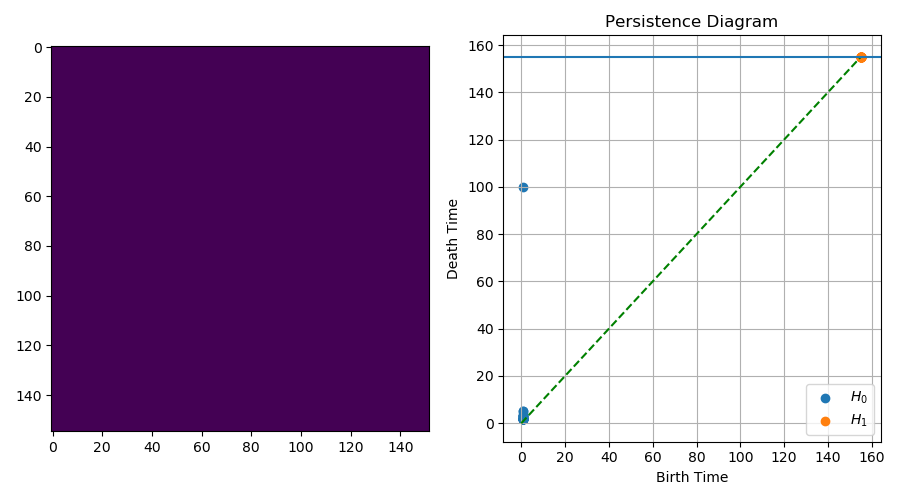

In [14]:
# setup display
display(widgets.HBox((ruleSlider, randomSlider, widthSlider, heightSlider)))
plt.figure(figsize=(9,5))
generate_CA_TDA()

# Persistent Homology Dimension

One topological descripter is the persistent homology dimension defined in the paper by MacPherson and Schweinhart: https://arxiv.org/abs/1011.2258, which does the following transformation,

![title](Plots/ph_coords.png)

PH Dimension is a global description of the persistent homology of a data set and is meant to capture the self-similarity of the space.  In some cases P.H. Dimension coincides with Hausdorff dimension, as in the case of the Serpinski gasket $d = -\log 3/ \log \rho$, 

![title](Plots/serpinski.png)




## Question: 

### *Can we use P.H. dimension and self-similarity to classify the rule space of Cellular Automata?*

# Cubical Ripser

To compute the persistent homology of a cellular automata, we used a variant of the RIPSER algorithm applied to cubical toplexes: https://github.com/infophysics/CubicalRipser2D.  Connectedness is determined by the *von Neumann* neighborhood; i.e.

![title](Plots/CA-von-Neumann.png)


Here are some examples showing the Persistent Homology Dimension for various rules,

![title](Plots/phd_60.png)
![title](Plots/phd_30.png)

Rule 60 should give a P.H. Dimension close to the Serpinski gakset $(\sim \log(3))$, however we get the value $d = 2.52$.  We compared the result using the standard RIPSER algorithm by constructing a point cloud from the $\mathcal{CA}$,

![title](Plots/phd_60.png)
![title](Plots/Rule_60.png)

At this point the results are still unclear, and the size of the automata seems to have an affect on the stability of the P.H. dimension,

![title](Plots/Rule_60_PHDs.png)
![title](Plots/Rule_150_PHDs.png)

To compare with other methods for computing fractal dimension, we used a simple implementation of the box-counting method, which does far better at estimating the fractal dimension as is also incredibly stable.  Below is a plot comparing the $L^1$ filtration PH Dimension of Rule 60 with the box-counting dimension,

![title](Plots/Rule_60_Cube_PH_BC_L1_1.png)

# Multi Dimensional Scaling

Multidimensional scaling (MDS) was used to explore whether the collection of 1DCA resulting from each of the 256 rules may have a lower dimensional representation.

MDS attempts to represent data in a lower dimensional space while preserving distances between individual data points.

It can be treated as an optimization problem:
\begin{equation*}
\begin{aligned}
& \underset{x_1,\dots ,x_n}{\text{min}}
& & \sum_{i<j}(\|x_i-x_j\|-\delta_{i,j}) 
\end{aligned}
\end{equation*}
where each $x_i$ low dimensional vector representing the ith data point, and $\delta_{i,j}$ is the $i,j$ entry of the distance matrix of the data.


## One Cell Initialization

![title](Plots/MDS_One_Cell.png)

![title](Plots/MDS_One_Cell_Clus.png)

The dataset was generated from a 101 cell array randomly initialized with approximately 50% of cells in state 1.  Each of the 256 rules was applied over 100 iterations to create an image.  An example is shown below:

![title](Plots/Rule_110.png)

To prepare the data for MDS, images were flattened into (101$\times$100) dimensional vectors.  Two compontent MDS was applied.

# Random Initial Conditions
![title](Plots/MDS_Random.png)

![title](Plots/MDS_Class_1R.png)

![title](Plots/MDS_Class_3R.png)

![title](Plots/MDS_Class_4R.png)

# Remarks:

Under randomized initial conditions, the Class 1 rules were grouped into two antipodal clusters, corresponding to a steady state of all cells in state 1 or all cells in state 2.

Class 3 and 4 mostly clustered together, with Class 3 occupying the central part of each cluster, and Class 4 occupying the exterior.

One MDS coordinate seemed to correspond to the net concentration of state 1 or state 0 cells in an image.


<tr>
    <td> <img src="Plots/MDS_Random.png" alt="Drawing" style="width: 500px;"/> </td>
    <td> <img src="Plots/MDS_One_Cell.png" alt="Drawing" style="width: 500px;"/> </td>
</tr>

# Sliding Windows Embedding

We used 1D persistent homology to measure the geometric existence  of loops.

![title](Plots/tralie2.png)

A periodicity score may be obtained from a sliding windows embedding by selecting the maximum $H_1$ persistence bar length over a range of window sizes.

This periodicity score can be combined with the two MDS components shown previously to give a 3 dimensional representation of 1DCA rules:

In [27]:
# some 1D rules MDS
CA.display_CA('Plots/3D_Plot.mp4')

In [29]:
# Here is the same projection with only class 3 and 4
CA.display_CA('Plots/3d_Plot_Class3_and_4.mp4')

# Predictions


<center> Predictions without MDS</center>

| Actual Class | I Predict | II Predict | III Predict | IV Predict | Accuracy |
|--------------|-----------|------------|-------------|------------|----------|
| I            | 24        | 0          | 0           | 0          | 1        |
| II           | 25        | 169        | 0           | 0          | .871     |
| III          | 1         | 16         | 15          | 0          | .454     |
| IV           | 0         | 5          | 1           | 0          | 0.0      |



<center> Predictions with MDS</center>

| Actual Class | I Predict | II Predict | III Predict | IV Predict | Accuracy |
|--------------|-----------|------------|-------------|------------|----------|
| I            | 23        | 1          | 0           | 0          | .958     |
| II           | 0         | 187        | 5           | 2          | .964     |
| III          | 0         | 7          | 25          | 0          | .781     |
| IV           | 0         | 2          | 1           | 3          | 0.5      |

# Conway's Game of Life

Typical studies of two-dimensional Automata are that of binary cells with "totality" rules.  Totality rules ignore directionality of nearest neighbors and instead update only with respect to the number of neighbors that are alive in their vicinity.

<tr>
    <td> <img src="Plots/CA-Moore.png" alt="Drawing" style="width: 250px;"/> </td>
    <td> <img src="Plots/CA-von-Neumann.png" alt="Drawing" style="width: 250px;"/> </td> 
</tr>

To generate a CA like the game of life, we will use the *rulestring* B/S/n convention.  From Wikipedia; 

"Generations rules are described by rulestrings of the form Bx/Sy/n[note 2] or y/x/n, an extension of B/S 
and S/B rulestrings where n is any natural number ≥2. Patterns evolve according to the following rules:

    A cell in state 0 ("dead") will advance to state 1 ("get born") in the next generation of the pattern 
    if the number of neighbors in state 1 ("live") in its Moore neighbourhood is present in the rule's 
    birth conditions (Bx).
    
    A cell in state 1 ("live") will:
        Remain in state 1 ("survive") in the next generation of the pattern if the number of neighbors 
        in state 1 ("live") in its Moore neighborhood is present in the rule's survival conditions (Sx).
        Advance to state 2 ("age") in the next generation of the pattern otherwise.
        
    A cell in state m ≥ 2 will advance to state ((m + 1) mod n) in the next generation of the pattern. 
    In particular, a cell in state n will reset to state 0 ("die").

Any outer-totalistic Life-like cellular automaton with rulestring B.../S... is equivalent to the Generations 
rule with rulestring B.../S.../2."

So, for Conways rules the rulestring will be - "B3/S23/2".  If we want to generate a CA using Conways rules, 
we would instantiate the following object;

In [30]:
# generate a CA with conways rules, 50x50 cells, toroidal topology, a .37 density and 30 time steps.
ca = Conway("B3/S23/2", 50, 1, .37, 30)

# to see how the rule is converted to a number,
print("Number conversion -",ca.getRule())  # 6152

Number conversion - 6152


From here we can generate a random CA sequence using these rules

In [31]:
# initialize cells with density of .37
ca.initializeTwoDimensionalCells()

# generate a sequence using the specified time of 30
sequence = ca.generateTwoDimensionalSequence()

To save the sequence, use the save_CA function

<IPython.core.display.Javascript object>


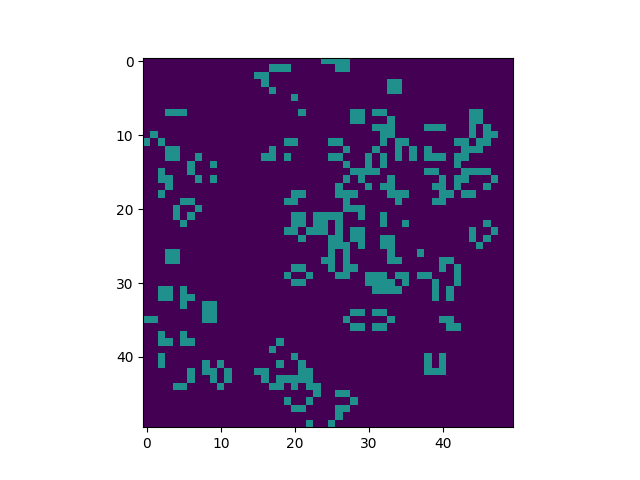

In [32]:
CA.save_CA(sequence, 'movie.mp4')

Then we can display it using the display_CA function

In [33]:
CA.display_CA('movie.mp4')

### APGcode Format

Using the apgcode format, we can imbed any CA object into the grid.  From Wikipedia;

Non-oversized still lifes, oscillators and patterns are encoded in extended Wechsler format, an extension of a pattern notation developed by Allan Wechsler in 1992.

    The pattern is separated into horizontal strips of five rows.
        Each strip, n columns wide, is encoded as a string of n characters in the set {0, 1, 2, ..., 8, 9, a, b, ..., v} denoting the five cells in a vertical column corresponding to the bitstrings {'00000', '00001', '00010', ..., '01000', '01001', '01010', '01011', ... '11111'}.
        The characters 'w' and 'x' are used to abbreviate '00' and '000', respectively, and the symbols {'y0', 'y1', y2', ..., 'yx', 'yy', 'yz'} are used to encode runs of between 4 and 39 consecutive '0's.
        Extraneous '0's at the ends of strips are not included in the encoding. (Note that in particular, blank five-row strips are represented by the empty string.)
    The character 'z' separates contiguous five-row strips.

Examples

xq4_27deee6 encodes a HWSS: 

<IPython.core.display.Javascript object>


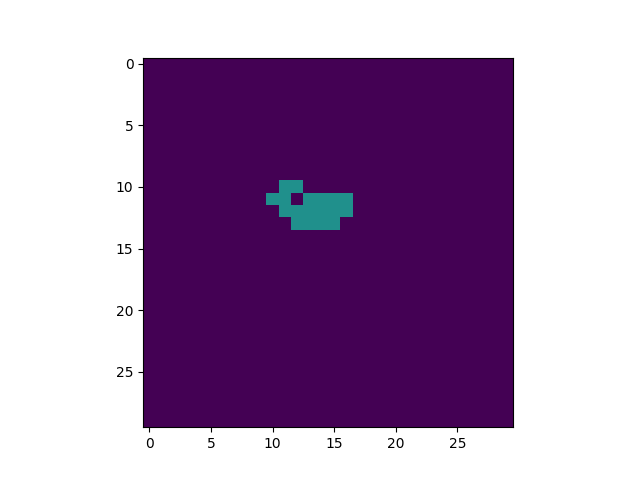

In [34]:
# generate an empty CA and place the space ship "xq4_27deee6"
ca = Conway("B3/S23/2", 30, 1, .37, 100)
ca.initializeTwoDimensionalEmptyCells()
ca.placeObject("xq4_27deee6", 10, 10, True)
CA.display_state(ca.getState())

Now we'll animate this CA

<IPython.core.display.Javascript object>


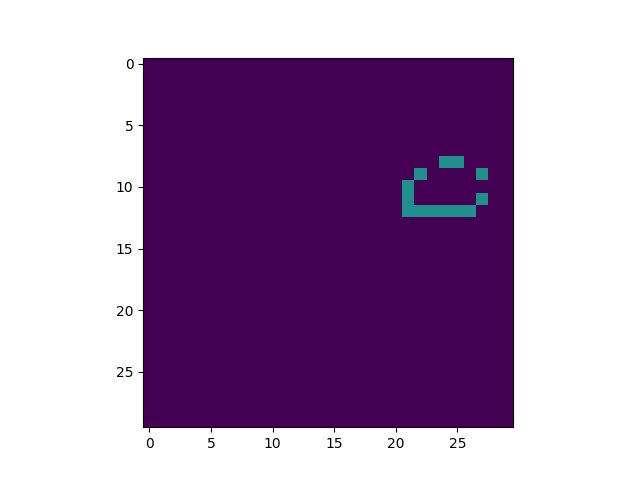

In [35]:
# generate an animation of this CA
sequence = ca.generateTwoDimensionalSequence()
CA.save_CA(sequence, 'movie2.mp4')

In [36]:
# display an animation of this CA
CA.display_CA('movie2.mp4')

Let's try a larger CA

<IPython.core.display.Javascript object>


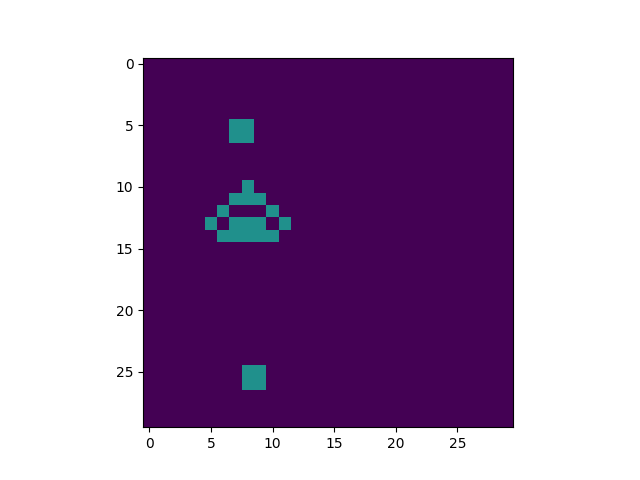

In [37]:
# set up a queen bee initialization
ca = Conway("B3/S23/2", 30, 1, .37, 100)
ca.initializeTwoDimensionalEmptyCells()
ca.placeObject("xp30_w33z8kqrqk8zzzx33", 5, 5, True)
CA.display_state(ca.getState())

<IPython.core.display.Javascript object>


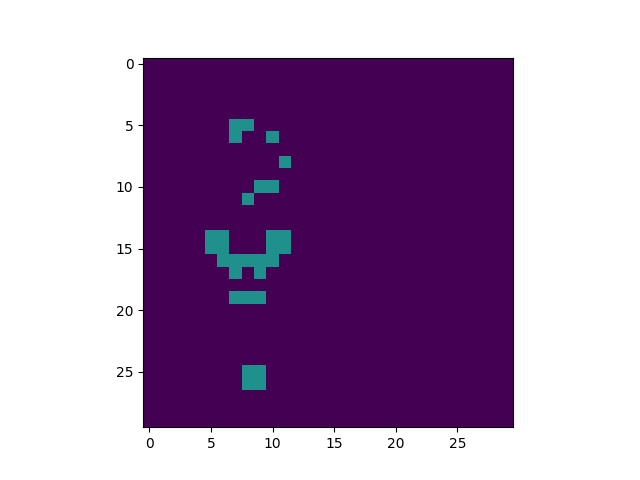

In [38]:
# generate an animation of this CA
sequence = ca.generateTwoDimensionalSequence()
CA.save_CA(sequence, 'movie2.mp4')

Let's Display This CA

In [39]:
CA.display_CA('movie2.mp4')

One interesting repeater is the Gosper gun

![title](Plots/gosper.gif)

The Figure below shows an example of 1D persistence homology, the H1 curve is due to the presence of loops  of the same class as result of the oscillators motion in over short time periods in the video.  The two other points in the 1D persistence diagram correspond to the loops created by the periodicity of the glider guns motions, clearly these loops have much higher persistence than the oscillators loops.  

Colors in the PCA embedding indicate the position of the window in time, with cool colors (greens and yellows) indicating earlier windows and hot colors (oranges and reds) indicating later windows.

The roundness in the PCA projection embedding  corresponds to the closeness of the eigenvalues to each other, more close values results more circular shape in the PCA projection. 

![title](Plots/glider.png)

# Multi-State Rules

Other rule spaces in two-dimensional Automata can have interesting self-replicating behavior, such as $B3/S23/11$, which is Conway's Rules for an 11 state Automata.  The following example is a "reflectionless rotating oscillar", for which we can run sliding windows embedding to determine it's periodic behavior.  This rotator has rule code - *xp32\_ss2gzw11\_wsfm76cg\_x86668\_wke2024\_ws6i1\_x1*

In [40]:
CA.display_CA('Plots/refl_rotator.mp4')

Sliding Window Embedding of the reflectorless rotating oscillator.

![title](Plots/refl.png)

# Oscillators in Conway's Game of Life

In cellular automata, an oscillator is any pattern of cells that will repeat itself in a later generation.  There are hundreds of known oscillators in Conway's Game of Life.

Sliding Windows Embedding can also be used to measure periodic behavior in these oscillators.

Goals:

	1. Use SWE to identify an oscillator randomly selected from a list of known oscillators.
    
	2. Find the maximum persistence of an oscillator across a range of window sizes, and compare to the natural period of the oscillator.
    
	3. Use the maximum persistence value as a factor to predict whether a patch of cells contains an oscillating pattern.

In [41]:
CA.display_CA('Plots/osc.mp4')

Below is a plot of the maximum H1 persistence value for various sliding window embedding window sizes of the above oscillator

![title](Plots/SWE_2DCA_No_Noise.png)

<IPython.core.display.Javascript object>


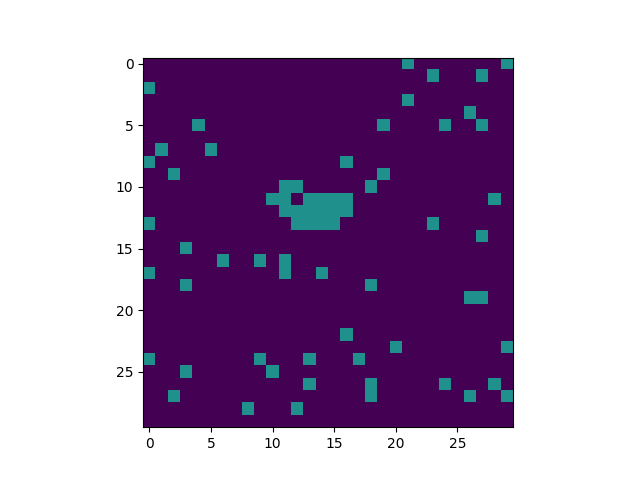

In [42]:
# generate an noisy CA and place the space ship "xq4_27deee6"

ca = Conway("B3/S23/2", 30, 1, .05, 100)
ca.initializeTwoDimensionalCells()
ca.placeObject("xq4_27deee6", 10, 10, False)
CA.display_state(ca.getState())

<IPython.core.display.Javascript object>


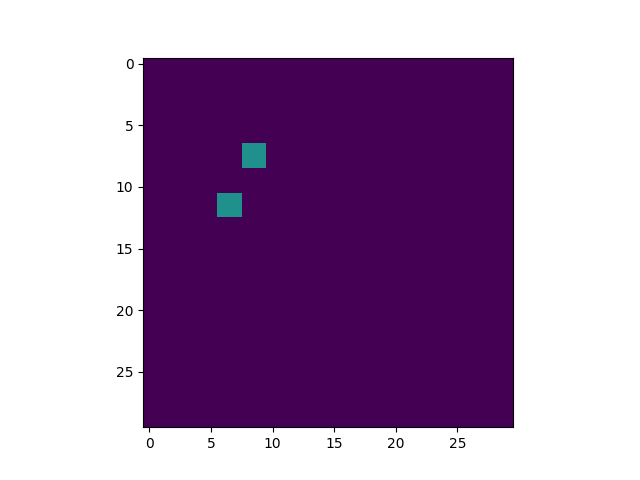

In [43]:
# generate an animation of this CA
sequence = ca.generateTwoDimensionalSequence()
CA.save_CA(sequence, 'movie3.mp4')

In [44]:

CA.display_CA('movie3.mp4')

In [45]:
# Below is a large CA with lots of noise introduced.

CA.display_CA('Plots/noise.mp4')

And the corresponding max persistence for varying window size,

![title](Plots/detect_osc.png)

# Future Research

 1. Understand the subtleties with PH Dimension with respect to cubical complexes.
 
 2. Understand whether topological properties generalize Wolfram's Universality classes.
 
 3. Understand the cause of the continuous curve formed in the Sliding Windows Embedding persitence diagram of the Glider Gun.
 
 4. Improve classification accuracy of oscillators in the presence of noise.